In [1]:
import os
import sys
import re
from pathlib import Path

from IPython.display import display, HTML, Markdown
import numpy as np
import pandas as pd

import matplotlib as mpl
from matplotlib.gridspec import GridSpec
import matplotlib.pyplot as plt
import seaborn as sns

# Project level imports
from larval_gonad.notebook import Nb
from larval_gonad.plotting import add_color_labels_w_rep, flip_ticks

In [2]:
# Setup notebook
nbconfig = Nb.setup_notebook(seurat_dir='../output/scrnaseq-wf/scrnaseq_combine_force')

last updated: 2018-10-04 
Git hash: 42b50b2bae7773307f49194899ffbeb2475982b9


In [3]:
mpl.rcParams.update({
    'figure.figsize': (10.0, 10.0),
    'figure.titlesize': 28.0,
    'figure.titleweight': 'black',
    'figure.dpi': 600,
    'font.size': 20,
    'grid.linewidth': 1.6,
    'axes.labelsize': 20,
    'axes.titlesize': 28,
    'axes.titleweight': 'normal',
    'lines.linewidth': 3,
    'lines.markeredgewidth': 0.1,
    'lines.markersize': 12.0,
    'legend.fontsize': 16.0,
    'patch.linewidth': 0.1,
    'xtick.labelsize': 20.0,
    'xtick.major.pad': 11.2,
    'xtick.major.width': 2,
    'xtick.minor.width': 1,
    'ytick.labelsize': 20.0,
    'ytick.major.pad': 11.2,
    'ytick.major.width': 2,
    'ytick.minor.width': 1,
})

## Heatmap all genes with k-means

In [4]:
from sklearn.cluster import KMeans

In [5]:
zscores = pd.read_parquet('../output/scrnaseq-wf/tpm_zscore_w_rep.parquet', columns=nbconfig.sel_cluster_order_w_rep)

# calculate linkages
X = zscores.values
km = KMeans(n_clusters=10, random_state=42)
km.fit(X)
_dat = zscores.assign(km=km.labels_ + 1).sort_values('km')

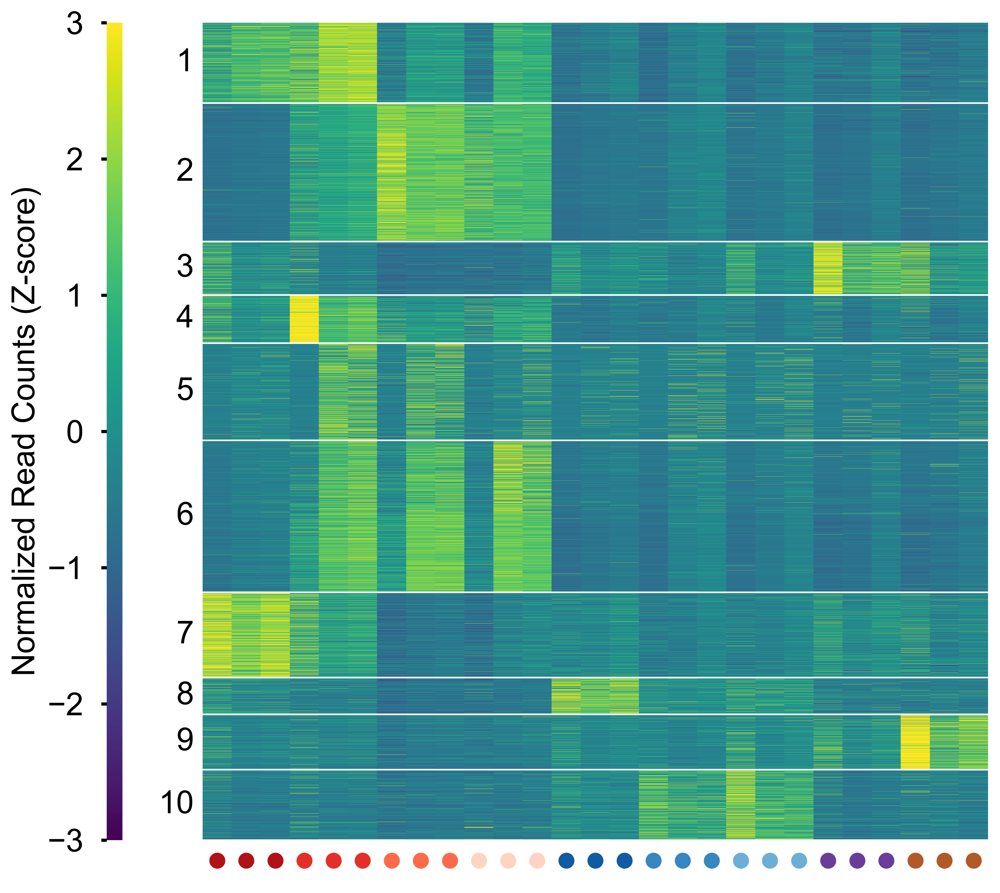

In [92]:
fig = plt.figure()
gs = GridSpec(2, 2, hspace=0, wspace=.2, height_ratios=[1, .05], width_ratios=[0.02, 1])
ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[1, 1])
axCbar = fig.add_subplot(gs[0, 0])

# plot
defaults = dict(
    yticklabels=False, 
    xticklabels=False, 
    vmin=-3, 
    vmax=3, 
    rasterized=True, 
    cmap=nbconfig.colors['heatmap'], 
    cbar_ax=axCbar,
    cbar_kws=dict(label='Normalized Read Counts (Z-score)')
)

sns.heatmap(_dat.drop('km', axis=1), ax=ax1, **defaults)
ax1.set_ylabel('')
add_color_labels_w_rep(ax2, s=10)

flip_ticks(axCbar)

# Add annotations
loc = 0
for g, dd in _dat.groupby('km'):
    loc += dd.shape[0]
    ax1.axhline(loc, color='w', lw=1)
    ax1.text(-.3, loc - (dd.shape[0] / 2), g, va='center', ha='right', color='k')
    
fig.savefig('../output/sharvani_poster_heatmap_all_genes.svg')

## Heatmap lit genes

In [7]:
lit_genes = [
    'vas', 'Phf7', 'CG11697', 'p53', 'nos', 'bgcn', 'bam', 'tut', 'Rbp9', 'peb', 'tej', 'Marf', 
    'nht', 'can', 'aly', 'fzo', 'soti', 'dj', 'bol', 'ocn', 'mle', 'mia', 'CG3927', 'sunz', 'sowi',
    'c-cup', 'd-cup', 'wa-cup', 'p-cup', 'r-cup', 'oys', 'topi', 'sa', 'CG8368', 'zfh1', 'vn', 'foxo', 
    'apt', 'ImpL2', 'Wnt4', 'Nrt', 'bnb', 'neur', 'robo2', 'EcR', 'gbb', 'spict', 'puc', 'sev', 'tj', 
    'hui', 'sano', 'eya', 'glob1', 'Eip93F', 'fax', 'kek1', 'so', 'nord', 'retn', 'abd-A', 'Abd-B', 
    'Wnt2', 'Six4', 'CG18628', 'MtnA', 'N', 'vkg', 'Sox100B', 'bw', 'ems', 'chinmo', 'His2Av', 'Diap1',
    'Diap2', 'Socs36E', 'hdc', 'how', 'msi', 'ken', 'piwi', 'stg', 'twe', 'esg'
]

In [8]:
zscores = pd.read_parquet('../output/scrnaseq-wf/tpm_zscore_w_rep.parquet', columns=nbconfig.sel_cluster_order_w_rep)

# Pull out lit genes
zscores.index = zscores.index.map(nbconfig.fbgn2symbol)
zscores_lit = zscores.reindex(lit_genes).dropna()

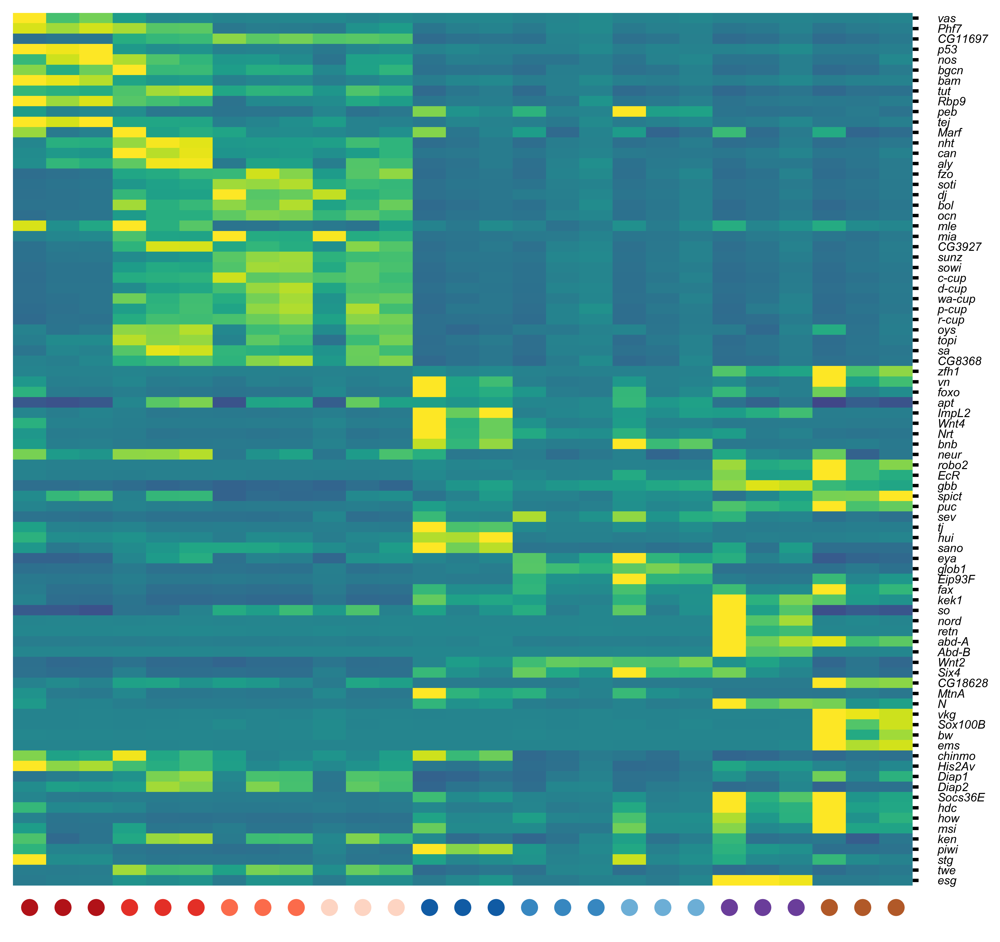

In [93]:
fig = plt.figure()
gs = GridSpec(2, 2, hspace=0, wspace=.05, height_ratios=[1, .05], width_ratios=[1, 0.02])
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])

# plot
defaults = dict(
    yticklabels=True, 
    xticklabels=False, 
    vmin=-3, 
    vmax=3, 
    cmap=nbconfig.colors['heatmap'], 
    cbar=False
)

sns.heatmap(zscores_lit, ax=ax1, **defaults)
ax1.set_ylabel('')
add_color_labels_w_rep(ax2, s=10)

flip_ticks(ax1, pos='right')
plt.setp(ax1.get_yticklabels(), rotation=0)

plt.setp(ax1.get_yticklabels(), fontsize=7, fontstyle='italic');
fig.savefig('../output/sharvani_poster_heatmap_lit_genes.svg')

In [140]:
fig = plt.figure(figsize=(20, 15))
gs = GridSpec(2, 3, hspace=0, wspace=.05, height_ratios=[1, .05], width_ratios=[0.02, 1, 1])
axAll = fig.add_subplot(gs[0, 1])
axAllLabel = fig.add_subplot(gs[1, 1])
axLit = fig.add_subplot(gs[0, 2])
axLitLabel = fig.add_subplot(gs[1, 2])
axCbar = fig.add_subplot(gs[0, 0])

# plot
defaults = dict(
    yticklabels=False, 
    xticklabels=False, 
    vmin=-3, 
    vmax=3, 
    rasterized=True, 
    cmap=nbconfig.colors['heatmap'], 
    cbar_ax=axCbar,
    cbar_kws=dict(label='Normalized Read Counts (Z-score)')
)

sns.heatmap(_dat.drop('km', axis=1), ax=axAll, **defaults)
axAll.set_ylabel('')
add_color_labels_w_rep(axAllLabel, s=10)

flip_ticks(axCbar)

# Add annotations
loc = 0
for g, dd in _dat.groupby('km'):
    loc += dd.shape[0]
    axAll.axhline(loc, color='w', lw=1)
    axAll.text(.2, loc - (dd.shape[0] / 2), g, va='center', ha='left', color='k')
    

defaults = dict(
    yticklabels=True, 
    xticklabels=False, 
    vmin=-3, 
    vmax=3, 
    cmap=nbconfig.colors['heatmap'], 
    cbar=False
)

sns.heatmap(zscores_lit, ax=axLit, **defaults)
axLit.set_ylabel('')
add_color_labels_w_rep(axLitLabel, s=10)

flip_ticks(axLit, pos='right')
plt.setp(axLit.get_yticklabels(), rotation=0, fontsize=7, fontstyle='italic');
fig.savefig('../output/sharvani_poster_heatmap_combined.svg')

## Heatmap bulk

In [4]:
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy import triu
from larval_gonad.normalization import tpm

In [5]:
# Import bulk data
tdt = ['C1_TDT', 'C3_TDT', 'C2_TDT', 'C4_TDT']
bulk = pd.read_parquet('../output/bulk-rnaseq-wf/aggregation/tpm_gene_level_counts.parquet', columns=tdt)
bulk.columns = ['Bulk-rep1', 'Bulk-rep2', 'Bulk-rep3', 'Bulk-rep4']

# import sc rnaseq data
raw = nbconfig.seurat.get_raw()
rep = raw.columns.str.extract('(?P<rep>rep\d)')
rep.index = raw.columns

# aggreagte to each rep
sc2 = raw.T.join(rep).groupby('rep').sum().T
sc2.columns = [f'scRNA-Seq-{rep}' for rep in sc2.columns]

# tpm normalize sc data
gene_lengths = pd.read_csv('../output/gene_ts_lengths.tsv', sep='\t', index_col=0).gene_ts_length
gene_lengths = gene_lengths.reindex(sc2.index)
_tpm = tpm(sc2, gene_lengths)

# join and get corr
dat2 = _tpm.join(bulk)
_corr = dat2.corr(method='spearman')

# Hierarchical clustering
link = linkage(_corr, 'average')
tree = dendrogram(link, no_plot=True)
leaves = tree['leaves']

# sort and pull out only upper triangle
_corr_sort = _corr.iloc[leaves, leaves]
_corr_sort[triu(_corr_sort, k=1) > 0] = np.nan

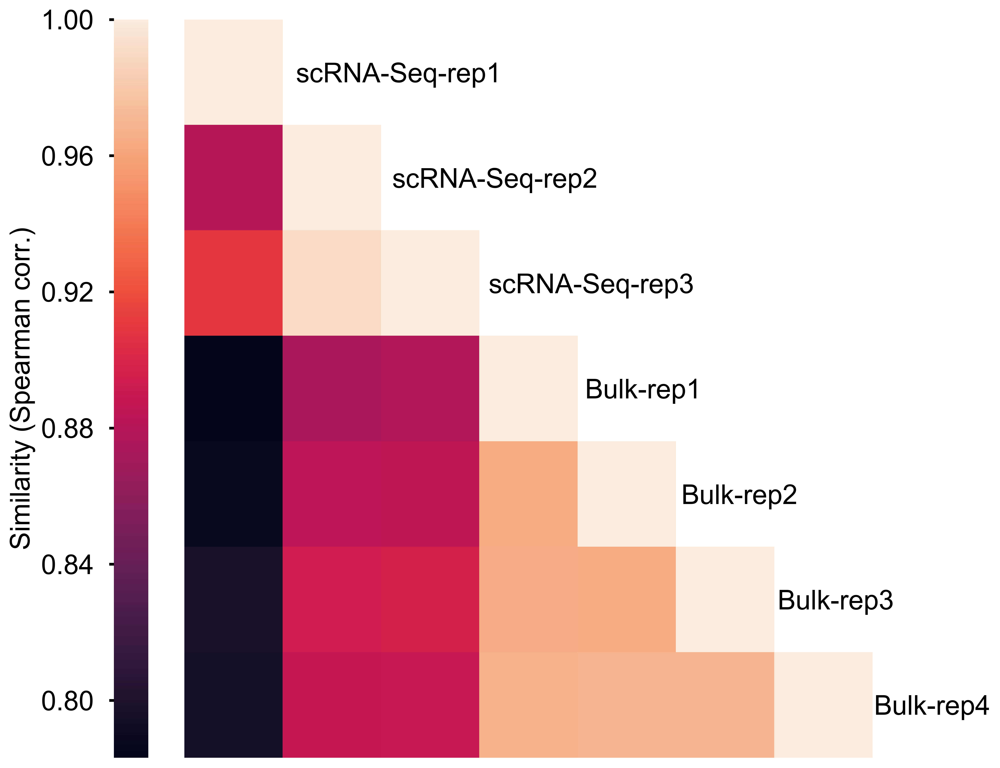

In [29]:
fig = plt.figure()
gs = GridSpec(1, 2, wspace=.1, width_ratios=[.05, 1])
axCbar = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])

# plot
defaults = dict(
    yticklabels=True, 
    xticklabels=False, 
    cbar_ax=axCbar,
    cbar_kws=dict(label='Similarity (Spearman corr.)', ) #orientation='horizontal')
)

sns.heatmap(_corr_sort, ax=ax1, **defaults)
flip_ticks(ax1, pos='right')
flip_ticks(axCbar)
plt.setp(ax1.get_yticklabels(), rotation=0);

x = .14
inc = .14
for tick in ax1.get_yticklabels():
    _, y = tick.get_position()
    tick.set_position((x, y))
    x += inc
    
ax1.tick_params(axis='both', which='both', length=0)

    
fig.savefig('../output/sharvani_poster_heatmap_bulk.svg')

## Ovary tsne

In [112]:
from larval_gonad.scRNAseq import TSNEPlot

In [106]:
ovary_tsne = pd.read_parquet('../../larval_gonad_ovary/scrnaseq-wf/data/tsne.parquet')
ovary_clusters = pd.read_parquet('../../larval_gonad_ovary/scrnaseq-wf/data/clusters.res.0.4.parquet').cluster

In [107]:
_tsne = ovary_tsne.join(ovary_clusters)

In [109]:
colors = sns.color_palette('tab20', n_colors=ovary_clusters.max() + 1, desat=.8)

In [110]:
dat = ovary_tsne.join(ovary_clusters)

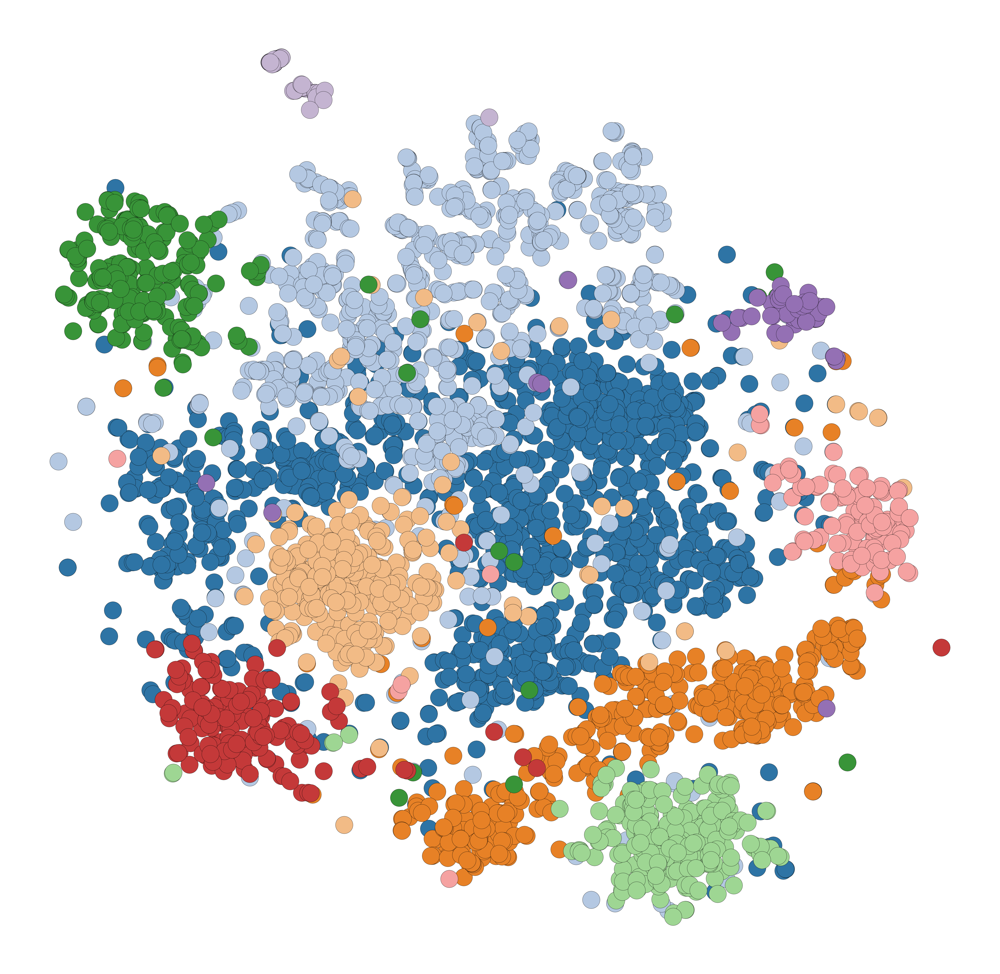

In [133]:
TSNEPlot(data=dat, hue='cluster', palette=colors, s=100)
fig = plt.gcf()
ax = plt.gca()
sns.despine(ax=ax, left=True, bottom=True)
ax.legend_.set_visible(False)
ax.set_xlabel('')
ax.set_ylabel('')
fig.savefig('../output/sharvani_poster_ovary_tsne.svg')

## Ovary heatmap all genes

In [6]:
from sklearn.cluster import KMeans

In [7]:
def ovary_add_color_labels(ax, s=5):
    clusters = ['clus0', 'clus1', 'clus2', 'clus3', 'clus4', 'clus5', 'clus6', 'clus7', 'clus8', 'clus9']
    lclus = len(clusters)
    colors = sns.color_palette('tab20', n_colors=lclus, desat=.8)
    cluster_cmap = dict(zip(clusters, colors))

    ax.set_xticks(np.arange(0, lclus + 1, 0.5))
    ax.set_xlim(0, lclus)

    for i, clus in enumerate(clusters):
        ax.plot(i + 0.5, 1, 'bo', markersize=s, color=cluster_cmap[clus])
        sns.despine(ax=ax, left=True, bottom=True)
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)

In [8]:
ovary_zscores = pd.read_parquet('../../larval_gonad_ovary/scrnaseq-wf/data/zscore_tpm.res.0.4.parquet')

# calculate linkages
X = ovary_zscores.values
ovary_km = KMeans(n_clusters=10, random_state=42)
ovary_km.fit(X)
ovary_dat = ovary_zscores.assign(ovary_km=ovary_km.labels_ + 1).sort_values('ovary_km')

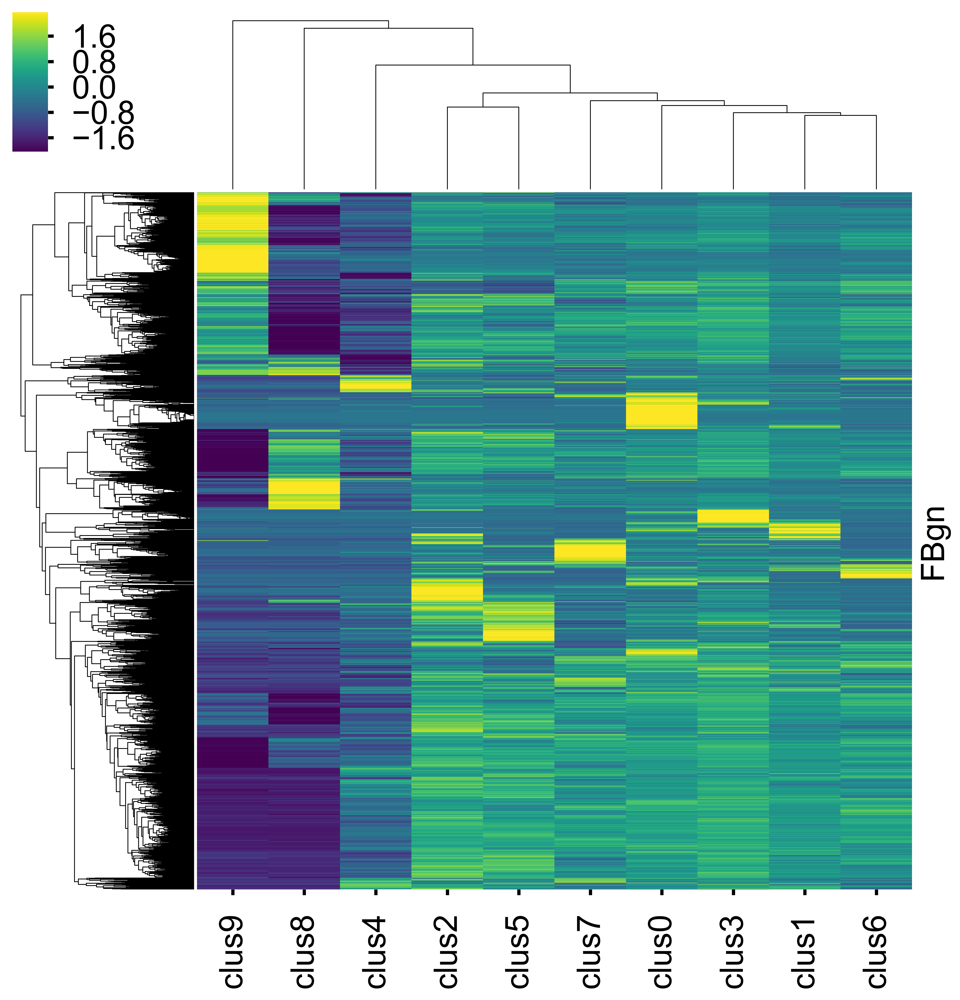

In [14]:
sns.clustermap(ovary_zscores, cmap='viridis', robust=True, yticklabels=False)

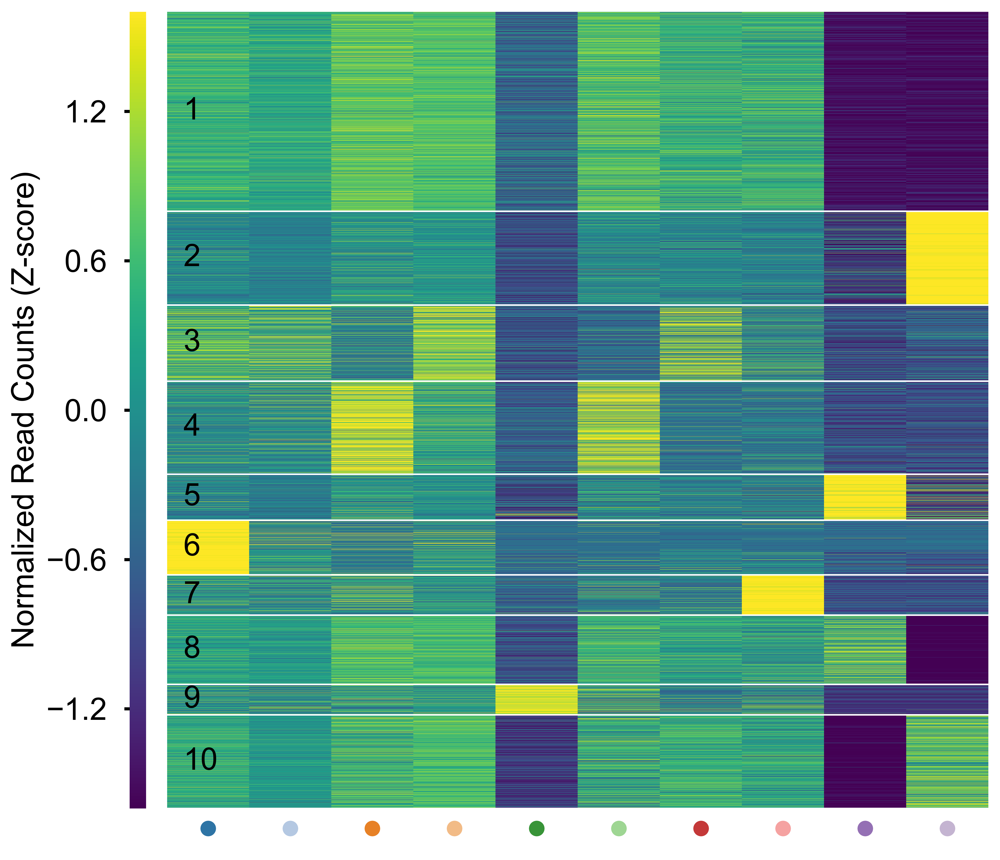

In [15]:
fig = plt.figure()
gs = GridSpec(2, 2, hspace=0, wspace=0.05, height_ratios=[1, .05], width_ratios=[0.02, 1])
ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[1, 1])
axCbar = fig.add_subplot(gs[0, 0])

# plot
defaults = dict(
    yticklabels=False, 
    xticklabels=False, 
    vmin=-1.6, 
    vmax=1.6, 
    rasterized=True, 
    cmap=nbconfig.colors['heatmap'], 
    cbar_ax=axCbar,
    cbar_kws=dict(label='Normalized Read Counts (Z-score)')
)

sns.heatmap(ovary_dat.drop('ovary_km', axis=1), ax=ax1, **defaults)
ax1.set_ylabel('')
ovary_add_color_labels(ax2, s=10)

flip_ticks(axCbar)

# Add annotations
loc = 0
for g, dd in ovary_dat.groupby('ovary_km'):
    loc += dd.shape[0]
    ax1.axhline(loc, color='w', lw=1)
    ax1.text(.2, loc - (dd.shape[0] / 2), g, va='center', ha='left', color='k')
    
#fig.savefig('../output/sharvani_poster_heatmap_ovary_all_genes.svg')